In [5]:
using Distributions,Statistics,Random,Gillespie,Plots,StatsBase, ProgressMeter

In [6]:
function F(x,parms)

    mRNA_1, TF, mRNA_2, target = x

    (k_w,g_w,k_q,g_q, k_r0, h_r, g_r, k_p, g_p, c) = parms
    
    mRNA_1_transcription = k_w
    mRNA_1_degradation = g_w * mRNA_1
    TF_translation = k_q*mRNA_1
    TF_degradation= g_q*TF
    mRNA_2_transcription = k_r(TF, k_r0, h_r, c)
    mRNA_2_degradation=g_r * mRNA_2
    target_translation = k_p * mRNA_2
    target_degradation = g_p * target
    
    [mRNA_1_transcription, mRNA_1_degradation, TF_translation, TF_degradation, mRNA_2_transcription, mRNA_2_degradation, target_translation, target_degradation]
end

function k_r(q, k_r0, h_r, c)
    return k_r0 * q^c / (h_r^c + q^c)
end

nu = [[1 0 0 0];
    [-1 0 0 0];
    [0 1 0 0];
    [0 -1 0 0];
    [0 0 1 0];
    [0 0 -1 0];
    [0 0 0 1];
    [0 0 0 -1]]

8×4 Matrix{Int64}:
  1   0   0   0
 -1   0   0   0
  0   1   0   0
  0  -1   0   0
  0   0   1   0
  0   0  -1   0
  0   0   0   1
  0   0   0  -1

In [7]:
# condizioni iniziali specie
x0=[0, 0, 0, 0]

#valori rate
k_w = 0.06
g_w = 0.006
k_q = 0.04
g_q = 0.002
k_r0 = 0.8
h_r = 200
g_r = 0.006
k_p = 0.04
g_p = 0.002
c = 2
      
#array parametri
parms=[k_w,g_w,k_q,g_q, k_r0, h_r, g_r, k_p, g_p, c]

#tempo max
t_f = 50 * log(2) / g_p

#simulazione
res = ssa(x0,F,nu,parms,t_f)

#step temporali
time_steps = res.time

#traiettoria specie 1 (mRNA_1)
mRNA_1_traj = res.data[:,1]

#traiettoria specie 2 (TF)
TF_traj = res.data[:,2]

#traiettoria specie 3 (mRNA2))
mRNA_2_traj = res.data[:,3]

#traiettoria specie 4 (target)
target_traj = res.data[:,4]

99327-element Vector{Int64}:
    0
    0
    0
    0
    0
    0
    0
    0
    0
    0
    ⋮
 1231
 1232
 1231
 1232
 1231
 1232
 1231
 1230
 1230

In [ ]:
t_f

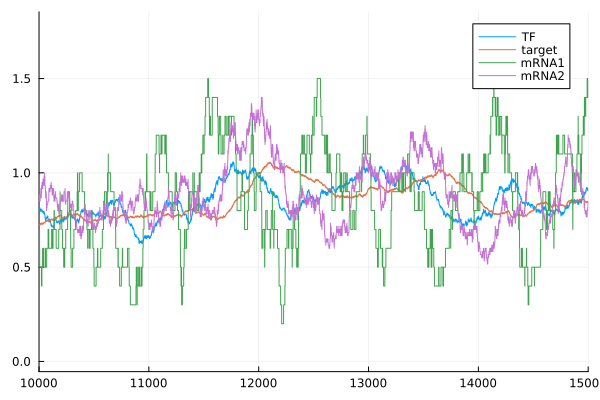

In [8]:
#plot delle traiettorie normalizzate a puntini
plot(time_steps, TF_traj./TF_traj[end], legend=:topright, label="TF")
plot!(time_steps, target_traj./target_traj[end], label="target")
plot!(time_steps, mRNA_1_traj./mRNA_1_traj[end], label="mRNA1")
plot!(time_steps, mRNA_2_traj./mRNA_2_traj[end], label="mRNA2")
#savefig("forward_loop_trajectorie_normalized.png")

# estraggo solo il grafico tra 5* 10^3 e 1 * 10^4
xlims!(10000, 15000) |> display
#savefig("forward_loop_trajectorie_zoom.png")




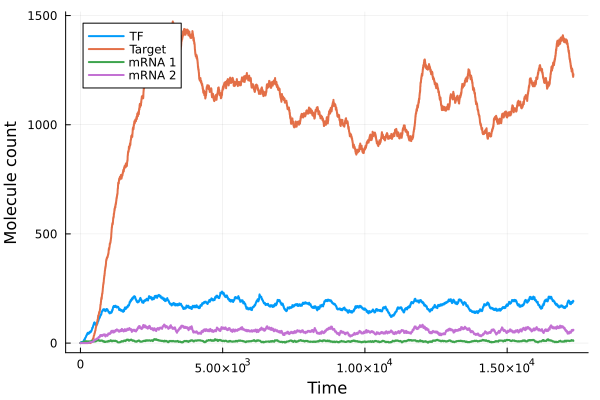

In [9]:
plot(time_steps, TF_traj, label="TF", xlabel="Time", ylabel="Molecule count", lw=2)
plot!(time_steps, target_traj, label="Target", lw=2)
plot!(time_steps, mRNA_1_traj, label="mRNA 1", lw=2)
plot!(time_steps, mRNA_2_traj, label="mRNA 2", lw=2)


In [ ]:
savefig("forward_loop_trajectories.png")

Starting... 100%|████████████████████████████████████████| Time: 0:02:03


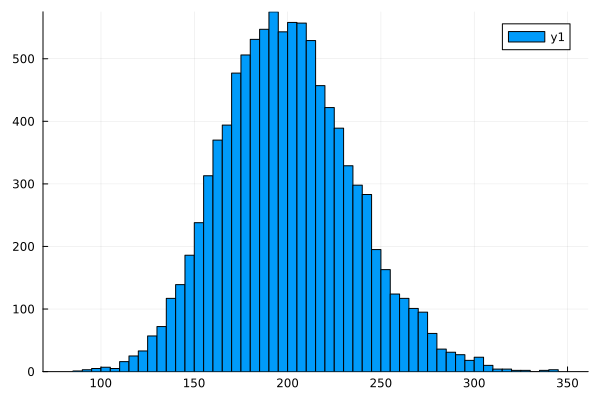

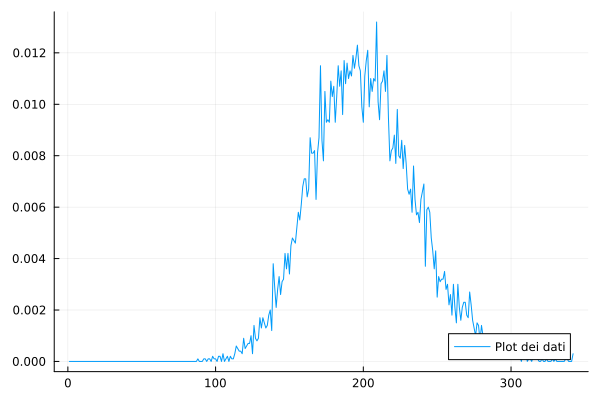

In [10]:
Nsim = 10000
p = Progress(Nsim, 1, "Starting...")
TF_av = zeros(Nsim)
target_av = zeros(Nsim)
for i in 1:Nsim
    res = ssa(x0,F,nu,parms,t_f)
    TF_traj = res.data[:,2]
    target_traj = res.data[:,4]
    TF_av[i] = TF_traj[end]
    target_av[i] = target_traj[end]
    next!(p)
end


TF_av = Int.(TF_av)
count_TF= zeros(maximum(TF_av)+1)
for i in 1:length(TF_av)
    count_TF[TF_av[i] + 1] += 1; 
end
count_TF ./= sum(count_TF)

histogram(TF_av) |> display
plot(count_TF, label="Plot dei dati", legend=:bottomright) |> display

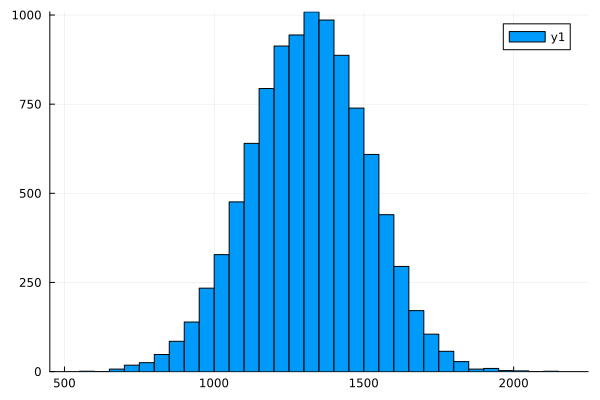

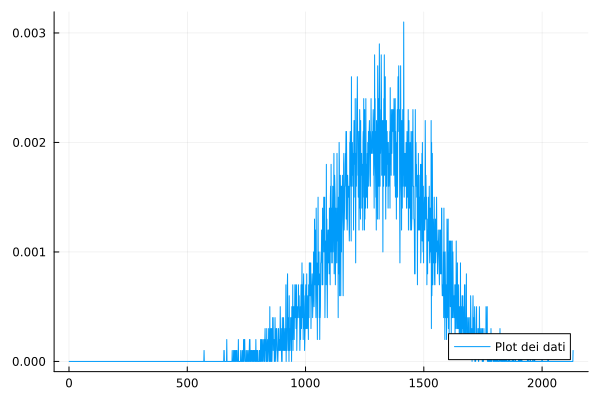

In [11]:
target_av = Int.(target_av)
count_target= zeros(maximum(target_av)+1)
for i in 1:length(target_av)
    count_target[target_av[i] + 1] += 1; 
end
count_target ./= sum(count_target)

histogram(target_av) |> display
plot(count_target, label="Plot dei dati", legend=:bottomright) |> display

In [ ]:
me_TF = mean(TF_av)
var_TF = std(TF_av)
me_target = mean(target_av)
var_target = std(target_av)

In [ ]:
me_target, var_target

In [ ]:
CV_TF = var_TF / me_TF
CV_target = var_target / me_target

In [ ]:
kw_list = [0.24, 0.12, 0.08, 0.06, 0.04, 0.03, 0.02, 0.01]
kq_list = [0.01, 0.02, 0.03, 0.04, 0.06, 0.08, 0.12, 0.24]


In [ ]:
N_k = length(kw_list)
Nsim = 10000
t_f = 10000.0
TF_vec = zeros(Nsim)
target_vec = zeros(Nsim)
CV_TF_vec = zeros(N_k)
CV_target_vec = zeros(N_k)
p = Progress(Nsim*N_k, 1, "Starting simulation")
for j in 1:N_k
    println("Simulazione $j:")
    k_w = kw_list[j]
    k_q = kq_list[j]
    parms=[k_w,g_w,k_q,g_q, k_r0, h_r, g_r, k_p, g_p, c]
    for i in 1:Nsim
        res = ssa(x0,F,nu,parms,t_f)
        TF_traj = res.data[:,2]
        target_traj = res.data[:,4]
        TF_vec[i] = TF_traj[end]
        target_vec[i] = target_traj[end]
        next!(p)
    end
    me_TF = mean(TF_vec)
    me_target = mean(target_vec)
    std_TF = std(TF_vec)
    std_target = std(target_vec)
    CV_TF_vec[j] = std_TF / me_TF
    CV_target_vec[j] = std_target / me_target
    
end
    

In [ ]:
scatter(CV_TF_vec, CV_target_vec, group=1:N_k, legend=:topright, xlabel="CV TF", ylabel="CV target", title="CV target vs CV TF")

In [ ]:
@show CV_TF_vec
@show CV_target_vec

In [ ]:
CV_TF_vec = [0.10658838801738878, 0.13238157312422602, 0.15679956403939327, 0.17321050546156821, 0.2067613404463426, 0.2375541145179724, 0.28387307580132104, 0.39601426059474387]
CV_target_vec = [0.10317209766681558, 0.12006755871236119, 0.1365920708437204, 0.14750872356859773, 0.17165180017763296, 0.18958359358649124, 0.22343246854652377, 0.3014497045178255]
cor(CV_TF_vec, CV_target_vec)

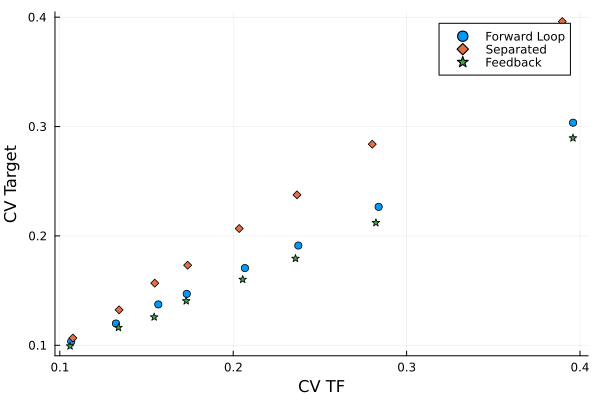

In [12]:
q_forward = [0.10658838801738878, 0.13238157312422602, 0.15679956403939327, 0.17321050546156821, 0.2067613404463426, 0.2375541145179724, 0.28387307580132104, 0.39601426059474387]
q_open = [0.10755107551328258, 0.1341847340103233, 0.15475048364776317, 0.17372387796779476, 0.20345638218299866, 0.2367710155083725, 0.28018638522116435, 0.38977083456893163]
q_feedback = [0.10591799959561832, 0.13381734420070773, 0.15441998728737338, 0.17290291324873552, 0.20547177146913392, 0.23591754003327786, 0.28229375184630456, 0.39593505183875743]
open = [0.10658838801738878, 0.13238157312422602, 0.15679956403939327, 0.17321050546156821, 0.2067613404463426, 0.2375541145179724, 0.28387307580132104, 0.39601426059474387]
forward = [0.10350406329612676, 0.1199148391920102, 0.13733923606680876, 0.14699594792723947, 0.17057983363239307, 0.19119405100771467, 0.22657626092773409, 0.3035264779339472]
feedback = [0.0992827220514687, 0.11619618140527394, 0.12579645445190568, 0.14055047790115813, 0.16016827655867252, 0.17936454218601589, 0.21201121665615566, 0.28950525389058895]

#comparative plot
scatter(q_forward, forward, label="Forward Loop", xlabel="CV TF", ylabel="CV Target", legend=:topright)
scatter!(q_open, open, label="Separated", marker=:diamond)
scatter!(q_feedback, feedback, label="Feedback", marker=:star5)

